In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [28]:
#handling manipulation of data to get size of images and count them
import pandas as pd
import numpy as np
#handling showing images 
import matplotlib.pyplot as plt
%matplotlib inline
#handling style of showing images and graphics in matplotlib
#import seaborn as sns
#sns.set(style="whitegrid")
#handling folders and help in read and remove folders
import os
#handling pathes of folders and return content of specific pathes
import glob as gb
import cv2
import tensorflow as tf
from tensorflow import keras
import tensorflow_hub as hub
from tensorflow.keras import layers

In [3]:
trainpath ='/kaggle/input/brest-cancer/Breast Cancer DataSet/Train/'
testpath = '/kaggle/input/brest-cancer/Breast Cancer DataSet/Test/'
validpath = '/kaggle/input/brest-cancer/Breast Cancer DataSet/valid/'

In [4]:
for folder in  os.listdir(trainpath ) : 
    files = gb.glob(pathname= str( trainpath + folder + '/*.png'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 386 in folder Benign
For training data , found 422 in folder Malignant


In [5]:
for folder in  os.listdir(testpath ) : 
    files = gb.glob(pathname= str( testpath + folder + '/*.png'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 64 in folder Benign
For training data , found 65 in folder Malignant


In [6]:
for folder in  os.listdir(validpath ) : 
    files = gb.glob(pathname= str( validpath + folder + '/*.png'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 97 in folder Benign
For training data , found 92 in folder Malignant


In [7]:
#dictionary of all exist classes and its numberic values in used in dataset 
code = {'Benign':0 ,'Malignant':1}

#used for getting name of class x  using its number n or y
def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

In [8]:
size = []

for folder in  os.listdir(trainpath ) : 
    files = gb.glob(pathname= str( trainpath + folder + '/*.png'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
        
#count each similar size contained in size list to know most common size in images        
pd.Series(size).value_counts()

(460, 700, 3)    808
dtype: int64

In [9]:
size = []
for folder in  os.listdir(testpath) : 
    files = gb.glob(pathname= str( testpath + folder + '/*.png'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(460, 700, 3)    129
dtype: int64

In [10]:
size = []
for folder in  os.listdir(validpath) : 
    files = gb.glob(pathname= str( validpath + folder + '/*.png'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(460, 700, 3)    189
dtype: int64

In [11]:
s = 224

In [12]:
#empty list to contain images itself called featues for the CNN model  
X_train = []
#empty list to contain actual value for each image
y_train = []

for folder in  os.listdir(trainpath ) : 
    files = gb.glob(pathname= str( trainpath + folder + '/*.png'))
    for file in files: 
        image = cv2.imread(file)
        #using cv2.resize without determine interpolation make it preserve aspect ratio for each image 
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [13]:
print(f'we have {len(X_train)} items in X_train')

we have 808 items in X_train


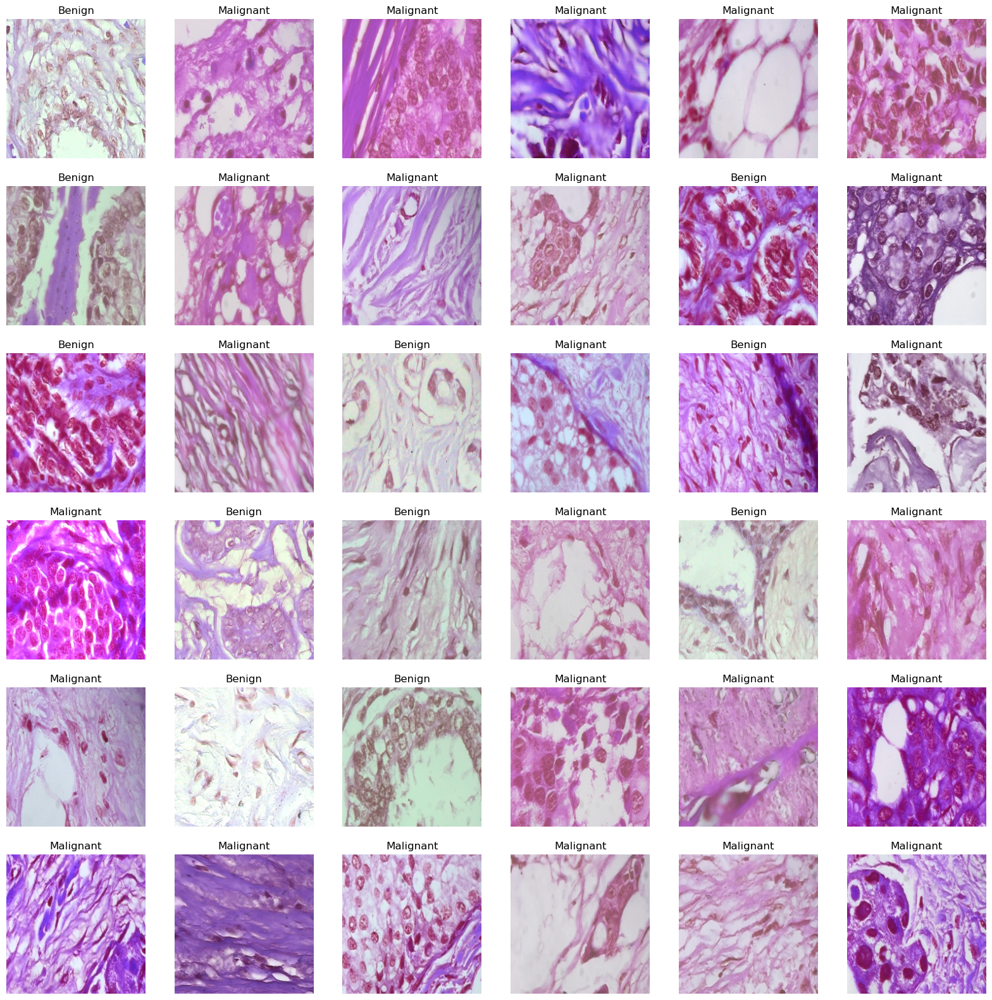

In [14]:
plt.figure(figsize=(20,20))

for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [15]:
X_test = []
y_test = []
for folder in  os.listdir(testpath ) : 
    files = gb.glob(pathname= str(testpath + folder + '/*.png'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])

In [16]:
print(f'we have {len(X_test)} items in X_test')

we have 129 items in X_test


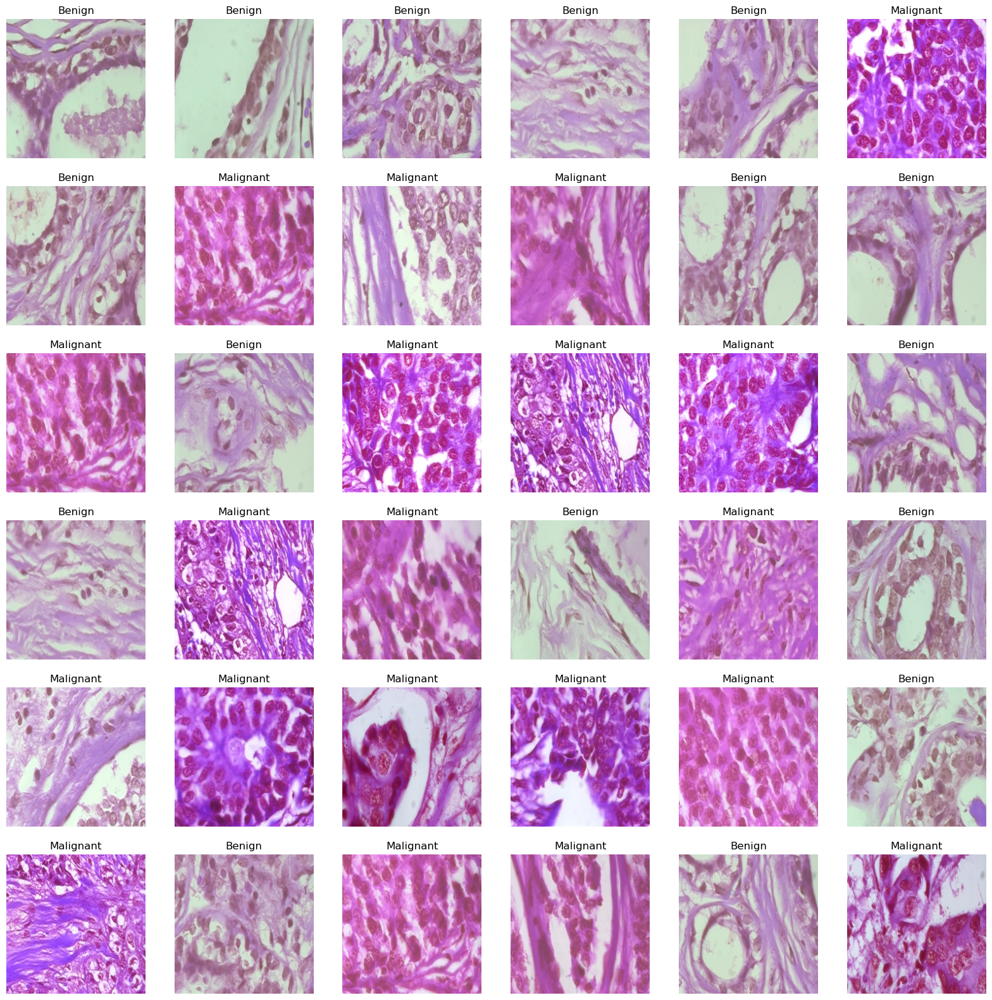

In [17]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [18]:
X_val = []
y_val = []
for folder in  os.listdir(validpath ) : 
    files = gb.glob(pathname= str(validpath + folder + '/*.png'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_val.append(list(image_array))
        y_val.append(code[folder])

In [19]:
print(f'we have {len(X_val)} items in X_val')

we have 189 items in X_val


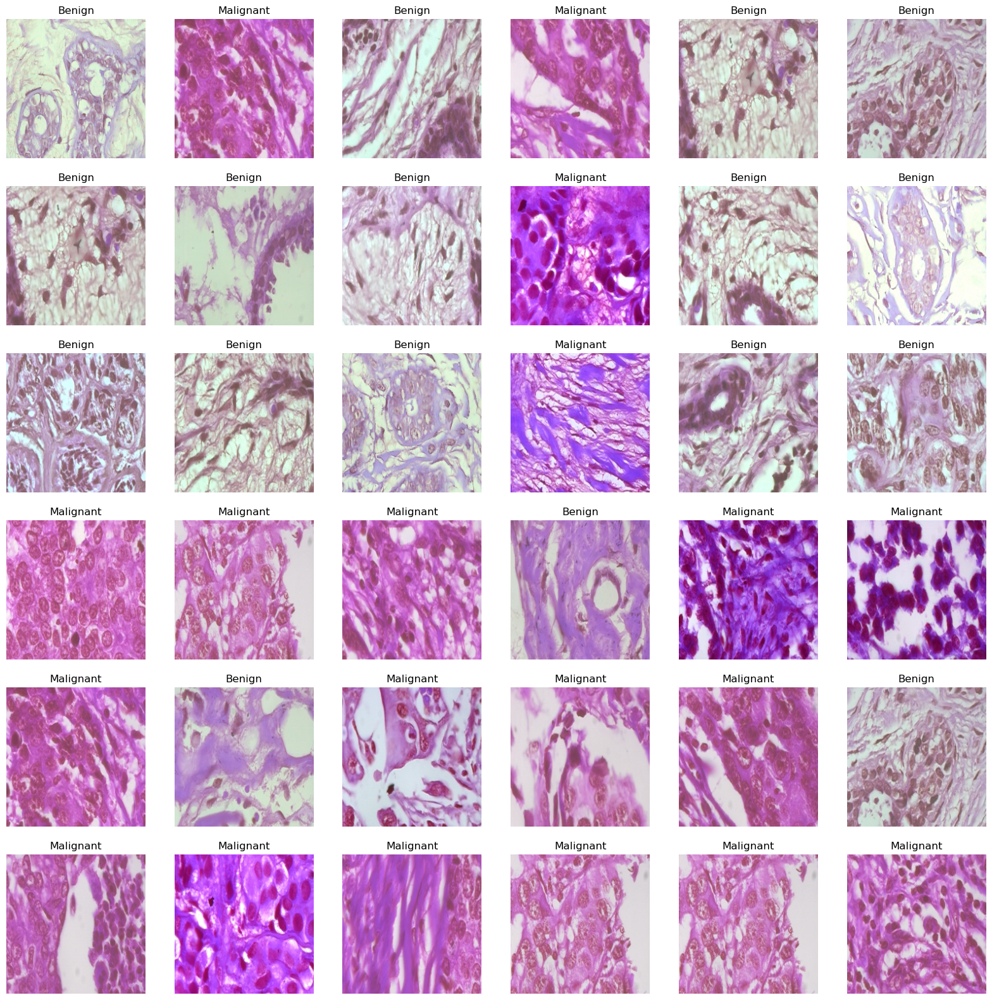

In [20]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_val),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_val[i])    
    plt.axis('off')
    plt.title(getcode(y_val[i]))

In [21]:
X_train = np.array(X_train)
X_test = np.array(X_test)

y_train = np.array(y_train)
y_test = np.array(y_test)

X_val = np.array(X_val)
y_val = np.array(y_val)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_val shape  is {X_val.shape}')


print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')
print(f'y_val shape  is {y_val.shape}')

X_train shape  is (808, 224, 224, 3)
X_test shape  is (129, 224, 224, 3)
X_val shape  is (189, 224, 224, 3)
y_train shape  is (808,)
y_test shape  is (129,)
y_val shape  is (189,)


In [22]:
model = keras.Sequential([
    # conv2D is the layer that applies the filters on data
    layers.Conv2D(30, (3,3), activation='relu', input_shape=(s, s,3)),
    # result = 30 image : 26*26
    layers.MaxPooling2D((2,2)),
    #pooling : 2*2 = 4 , take 1 , leave 3 (3/4)
    #pooling : 3*3 = 9 , take 1 , leave 8 (8/9)
    layers.Flatten(),
    layers.Dense(100, activation='relu'),
    keras.layers.Dense(10, activation='sigmoid')
])
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.fit(X_train,y_train,epochs=10)

Epoch 1/10
26/26 [==============================] - 15s 28ms/step - loss: 1458.2435 - accuracy: 0.6139
Epoch 2/10
26/26 [==============================] - 1s 24ms/step - loss: 16.6126 - accuracy: 0.7946
Epoch 3/10
26/26 [==============================] - 1s 24ms/step - loss: 2.2353 - accuracy: 0.8614
Epoch 4/10
26/26 [==============================] - 1s 25ms/step - loss: 0.5837 - accuracy: 0.9270
Epoch 5/10
26/26 [==============================] - 1s 26ms/step - loss: 0.1347 - accuracy: 0.9691
Epoch 6/10
26/26 [==============================] - 1s 27ms/step - loss: 0.0278 - accuracy: 0.9926
Epoch 7/10
26/26 [==============================] - 1s 26ms/step - loss: 0.0064 - accuracy: 0.9988
Epoch 8/10
26/26 [==============================] - 1s 24ms/step - loss: 0.0030 - accuracy: 1.0000
Epoch 9/10
26/26 [==============================] - 1s 25ms/step - loss: 0.0021 - accuracy: 1.0000
Epoch 10/10
26/26 [==============================] - 1s 25ms/step - loss: 0.0017 - accuracy: 1.0000


In [23]:
test_loss, test_accuracy = model.evaluate(X_test,y_test)
test_accuracy

5/5 [==============================] - 0s 29ms/step - loss: 10.7166 - accuracy: 0.8682


0.8682170510292053

In [24]:
out=model.predict(X_test)
y_predict= np.argmax(out,axis=1)
from sklearn.metrics import classification_report
print(classification_report(y_predict,y_test))

5/5 [==============================] - 0s 6ms/step
              precision    recall  f1-score   support

           0       1.00      0.50      0.66       129
           1       0.00      0.00      0.00         0

    accuracy                           0.50       129
   macro avg       0.50      0.25      0.33       129
weighted avg       1.00      0.50      0.66       129



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [25]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 30)      840       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 30)     0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 369630)            0         
                                                                 
 dense (Dense)               (None, 100)               36963100  
                                                                 
 dense_1 (Dense)             (None, 10)                1010      
                                                                 
Total params: 36,964,950
Trainable params: 36,964,950
Non-trainable params: 0
_______________________

In [26]:
model.evaluate(X_val,y_val)

6/6 [==============================] - 0s 41ms/step - loss: 0.1974 - accuracy: 0.9630


[0.197378009557724, 0.9629629850387573]

In [47]:
mobilenet_model = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"

mobilenet_model_without_top_layer = hub.KerasLayer(
    mobilenet_model, input_shape=(s, s, 3), trainable=False)

In [48]:
num_of_classes = 2

mobilenetmodel = tf.keras.Sequential([
  mobilenet_model_without_top_layer,
  tf.keras.layers.Dense(num_of_classes)
])

mobilenetmodel.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_5 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense_7 (Dense)             (None, 2)                 2562      
                                                                 
Total params: 2,260,546
Trainable params: 2,562
Non-trainable params: 2,257,984
_________________________________________________________________


In [49]:
mobilenetmodel.compile(
  optimizer="adam",
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc'])

mobilenetmodel.fit(X_train, y_train, epochs=5)

Epoch 1/5
26/26 [==============================] - 5s 36ms/step - loss: 0.6385 - acc: 0.6448
Epoch 2/5
26/26 [==============================] - 1s 33ms/step - loss: 0.4524 - acc: 0.7735
Epoch 3/5
26/26 [==============================] - 1s 32ms/step - loss: 0.4027 - acc: 0.8131
Epoch 4/5
26/26 [==============================] - 1s 33ms/step - loss: 0.3524 - acc: 0.8379
Epoch 5/5
26/26 [==============================] - 1s 32ms/step - loss: 0.3339 - acc: 0.8465


In [50]:
mobilenetmodel.evaluate(X_test,y_test)

5/5 [==============================] - 1s 34ms/step - loss: 0.4536 - acc: 0.7829


[0.4536459445953369, 0.7829457521438599]